In [2]:
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras.models import Sequential
from keras.layers import Dense
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split

In [3]:
data = pd.read_csv('heart.csv')
data

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,52,1,0,125,212,0,1,168,0,1.0,2,2,3,0
1,53,1,0,140,203,1,0,155,1,3.1,0,0,3,0
2,70,1,0,145,174,0,1,125,1,2.6,0,0,3,0
3,61,1,0,148,203,0,1,161,0,0.0,2,1,3,0
4,62,0,0,138,294,1,1,106,0,1.9,1,3,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1020,59,1,1,140,221,0,1,164,1,0.0,2,0,2,1
1021,60,1,0,125,258,0,0,141,1,2.8,1,1,3,0
1022,47,1,0,110,275,0,0,118,1,1.0,1,1,2,0
1023,50,0,0,110,254,0,0,159,0,0.0,2,0,2,1


In [4]:
data.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,52,1,0,125,212,0,1,168,0,1.0,2,2,3,0
1,53,1,0,140,203,1,0,155,1,3.1,0,0,3,0
2,70,1,0,145,174,0,1,125,1,2.6,0,0,3,0
3,61,1,0,148,203,0,1,161,0,0.0,2,1,3,0
4,62,0,0,138,294,1,1,106,0,1.9,1,3,2,0


In [5]:
data.tail()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
1020,59,1,1,140,221,0,1,164,1,0.0,2,0,2,1
1021,60,1,0,125,258,0,0,141,1,2.8,1,1,3,0
1022,47,1,0,110,275,0,0,118,1,1.0,1,1,2,0
1023,50,0,0,110,254,0,0,159,0,0.0,2,0,2,1
1024,54,1,0,120,188,0,1,113,0,1.4,1,1,3,0


In [6]:
data.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,1025.000000,1025.000000,1025.000000,1025.000000,1025.00000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000
mean,54.434146,0.695610,0.942439,131.611707,246.00000,0.149268,0.529756,149.114146,0.336585,1.071512,1.385366,0.754146,2.323902,0.513171
std,9.072290,0.460373,1.029641,17.516718,51.59251,0.356527,0.527878,23.005724,0.472772,1.175053,0.617755,1.030798,0.620660,0.500070
min,29.000000,0.000000,0.000000,94.000000,126.00000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,48.000000,0.000000,0.000000,120.000000,211.00000,0.000000,0.000000,132.000000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,56.000000,1.000000,1.000000,130.000000,240.00000,0.000000,1.000000,152.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,275.00000,0.000000,1.000000,166.000000,1.000000,1.800000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.00000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


In [7]:
data.dtypes

age           int64
sex           int64
cp            int64
trestbps      int64
chol          int64
fbs           int64
restecg       int64
thalach       int64
exang         int64
oldpeak     float64
slope         int64
ca            int64
thal          int64
target        int64
dtype: object

In [8]:
data.isnull().any()

age         False
sex         False
cp          False
trestbps    False
chol        False
fbs         False
restecg     False
thalach     False
exang       False
oldpeak     False
slope       False
ca          False
thal        False
target      False
dtype: bool

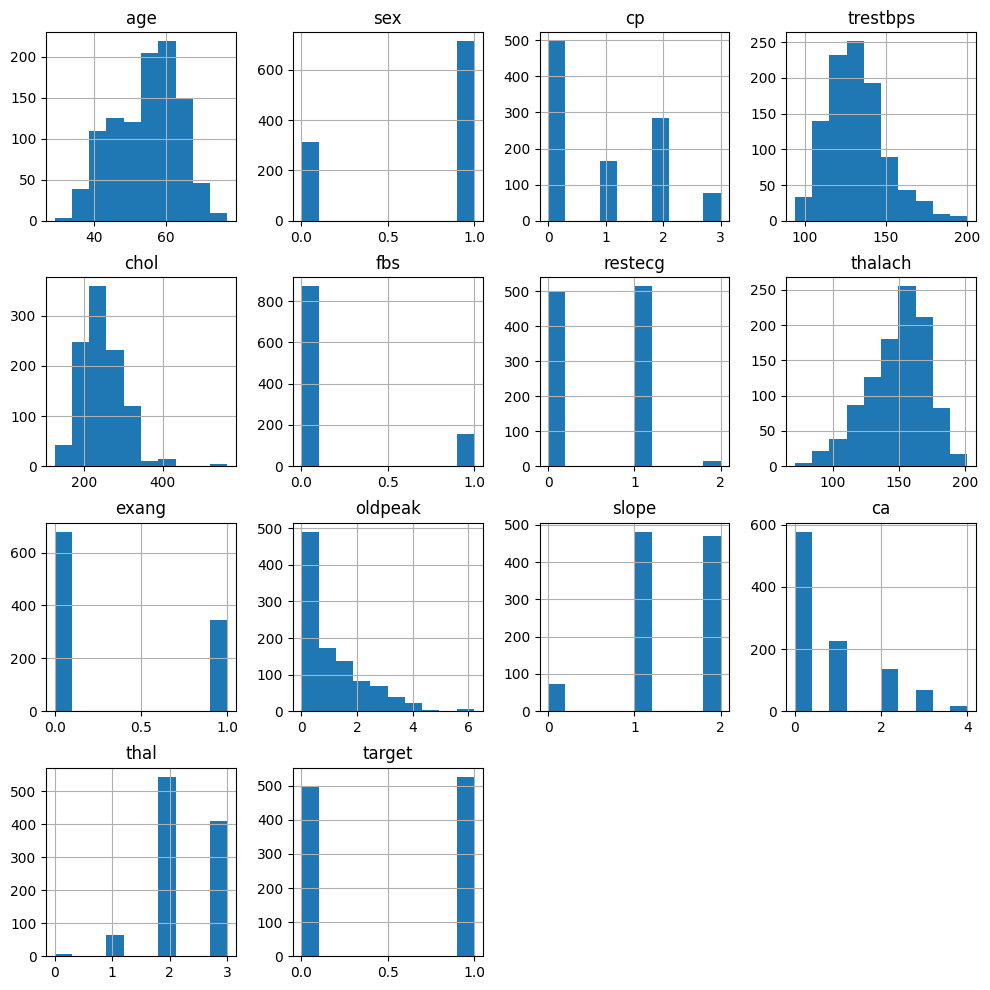

In [9]:
data.hist(figsize = (12, 12))
plt.show()

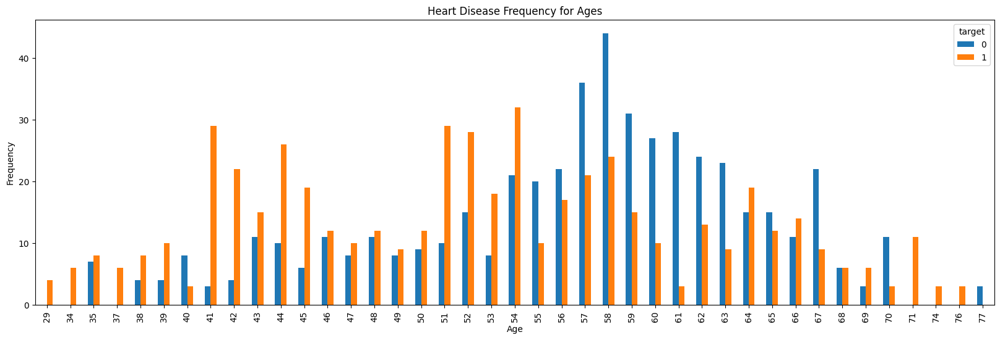

In [10]:
pd.crosstab(data.age,data.target).plot(kind="bar",figsize=(20,6))
plt.title('Heart Disease Frequency for Ages')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

In [11]:
X = data.iloc[:,:13].values
y = data["target"].values

In [12]:
X_train,X_test,y_train, y_test = train_test_split(X,y,test_size = 0.3 , random_state = 0 )

In [13]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [14]:
classifier = Sequential()
classifier.add(Dense(activation = "relu", input_dim = 13, 
                     units = 8, kernel_initializer = "uniform"))
classifier.add(Dense(activation = "relu", units = 14, 
                     kernel_initializer = "uniform"))
classifier.add(Dense(activation = "sigmoid", units = 1, 
                     kernel_initializer = "uniform"))
classifier.compile(optimizer = 'adam' , loss = 'binary_crossentropy', 
                   metrics = ['accuracy'] )

In [15]:
classifier.fit(X_train , y_train , batch_size = 8 ,epochs = 200)

Epoch 1/200
90/90 [==============================] - 1s 2ms/step - loss: 0.6856 - accuracy: 0.6597
Epoch 2/200
90/90 [==============================] - 0s 1ms/step - loss: 0.5662 - accuracy: 0.8410
Epoch 3/200
90/90 [==============================] - 0s 1ms/step - loss: 0.4211 - accuracy: 0.8466
Epoch 4/200
90/90 [==============================] - 0s 1ms/step - loss: 0.3734 - accuracy: 0.8466
Epoch 5/200
90/90 [==============================] - 0s 1ms/step - loss: 0.3615 - accuracy: 0.8466
Epoch 6/200
90/90 [==============================] - 0s 1ms/step - loss: 0.3564 - accuracy: 0.8522
Epoch 7/200
90/90 [==============================] - 0s 1ms/step - loss: 0.3523 - accuracy: 0.8563
Epoch 8/200
90/90 [==============================] - 0s 1ms/step - loss: 0.3472 - accuracy: 0.8605
Epoch 9/200
90/90 [==============================] - 0s 1ms/step - loss: 0.3436 - accuracy: 0.8647
Epoch 10/200
90/90 [==============================] - 0s 982us/step - loss: 0.3399 - accuracy: 0.8689
Epoch 1

In [16]:
classifier.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 8)                 112       
                                                                 
 dense_1 (Dense)             (None, 14)                126       
                                                                 
 dense_2 (Dense)             (None, 1)                 15        
                                                                 
Total params: 253 (1012.00 Byte)
Trainable params: 253 (1012.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [17]:
y_pred = classifier.predict(X_test)
y_pred = (y_pred > 0.5)

10/10 [==============================] - 0s 2ms/step


In [18]:
cm = confusion_matrix(y_test,y_pred)
cm

array([[145,   0],
       [  3, 160]], dtype=int64)

In [19]:
accuracy = (cm[0][0]+cm[1][1])/(cm[0][1] + cm[1][0] +cm[0][0] +cm[1][1])
print(accuracy*100,'%')

99.02597402597402 %


In [22]:
classifier.save('model.hdf5')

In [21]:
age=int(input("Age:"))
sex=int(input("Gender:"))
cp=int(input("CP:"))
trestbps=int(input("Trestbps:"))
chol=int(input("Chol:"))
fbs=int(input("fbs:"))
restecg=int(input("restecg:"))
thalach=int(input("thalach:"))
exang=float(input("exang:"))
oldpeak=int(input("oldpeak:"))
slope=int(input("Slope:"))
ca=int(input("ca:"))
thal=int(input("thal:"))


result=classifier.predict(sc.transform([[age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal]]))
if result[0] == 0:
    print("The person is not going to suffer a heart attack")
else:
    print("The person is going to suffer from heart attack") 

ValueError: invalid literal for int() with base 10: ''

In [1]:
import cv2
import mediapipe as mp
# initialize Pose estimator
mp_drawing = mp.solutions.drawing_utils
mp_pose = mp.solutions.pose

pose = mp_pose.Pose(
    min_detection_confidence=0.5,
    min_tracking_confidence=0.5)
# create capture object
cap = cv2.VideoCapture(0)

while cap.isOpened():
    # read frame from capture object
    _, frame = cap.read()

    	# convert the frame to RGB format
    RGB = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    # process the RGB frame to get the result
    results = pose.process(RGB)
    print(results.pose_landmarks)
        # draw detected skeleton on the frame
    mp_drawing.draw_landmarks(
    	frame, results.pose_landmarks, mp_pose.POSE_CONNECTIONS)

    # show the final output
    cv2.imshow('Output', frame)

    if cv2.waitKey(1) == ord('q'):
      break
cap.release()
cv2.destroyAllWindows()

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
